In [1]:
import numpy as np

class ElectricVehicle:
    def __init__(self, type, max_speed_kmh, battery_capacity, battery_now, charging_rate, current_lat, current_lon):
        self.type = type
        self.max_speed = max_speed_kmh  # Kecepatan Maksimal (km/jam)
        self.capacity = battery_capacity  # Kapasitas Baterai (total kWh)
        self.battery_now = battery_now  # Baterai Sekarang (kWh)
        self.charging_rate = charging_rate  # Kecepatan Ngecas (kWh per menit)
        self.current_lat = current_lat # Latitude Sekarang
        self.current_lon = current_lon # Longitude Sekarang

class ChargingSlot:
    def __init__(self, charging_rate):
        self.charging_rate = charging_rate # kWh/h
        self.available = True

class ChargingStation:
    def __init__(self, env, node_id, total_slots, slots_charging_rate, slots_availability_std, slots_availability_mean):
        self.env = env
        self.node_id = node_id # Node ID
        self.total_slots = total_slots # Jumlah Slot
        self.slots_charging_rate = slots_charging_rate # Array dengan isi charging rate setiap slot
        self.slots = [ChargingSlot(rate) for rate in slots_charging_rate] # Array dengan isi Charging Slot
        self.slots_availability_std = slots_availability_std # STD Ketersediaan Slot
        self.slots_availability_mean = slots_availability_mean # Mean Ketersediaan Slot

    # Menemukan slot yang tersedia (is_available == True dan Charging Rate <= EV Charging Rate), serta mengambil yang nilainya paling max
    def find_available_slot(self, ev_charging_rate):
        available_slots = [slot for slot in self.slots if slot.available and slot.charging_rate <= ev_charging_rate]
        return max(available_slots, key=lambda slot: slot.charging_rate) if available_slots else None
    
    # Melakukan random charging station availability untuk Charging Station ini
    def random_availability(self):
        # Ambil sample jumlah slot yang available berdasarkan distribusi normal
        available_count = int(round(np.random.normal(
            loc=self.slots_availability_mean,
            scale=self.slots_availability_std
        )))

        # Clamp nilai available_count supaya tetap dalam batas 0 - total_slots
        available_count = max(0, min(available_count, self.total_slots))

        # todo: Melakukan random tetapi dengan data distribusi slot yang sudah ada
        # Randomize indeks slot yang akan available
        available_indices = np.random.choice(range(self.total_slots), available_count, replace=False)

        # Memasukkan availability
        for idx, slot in enumerate(self.slots):
            slot.available = (idx in available_indices)

        print(f"[Random Availability] Station {self.node_id}: "
              f"{available_count}/{self.total_slots} slot available")
    
    # Melakukan pengecasan
    def charge(self, ev, charging_time):
        # Melakukan random slots availability
        self.random_availability()

        # Mencari slot yang tersedia
        slot = self.find_available_slot(ev.charging_rate)
    
        # Kalau tidak menemukan slot makan skip charging
        if slot is None:
            print(f"[{ev.env.now:.2f}m] {ev.type} TIDAK menemukan slot yang kompatibel di {self.node_id}, lanjut tanpa charging.")
            return  # langsung skip charging

        slot.available = False

        # Hitung maksimum waktu yang dibutuhkan untuk full charge
        energy_needed = ev.capacity - ev.battery_now
        max_charging_duration = (energy_needed / slot.charging_rate) * 60  # menit

        # Ambil waktu charging yang lebih kecil: antara waktu yang diberikan atau sampai baterai penuh
        actual_charging_time = min(charging_time, max_charging_duration)

        print(f"[{ev.env.now:.2f}m] {ev.type} ngecas di {self.node_id} "
              f"dengan slot {slot.charging_rate:.2f} kWh/h selama {charging_time:.2f} menit")
        
        yield self.env.timeout(actual_charging_time)

        # Tambahkan energi ke baterai
        energy_added = (actual_charging_time / 60) * slot.charging_rate # dalam menit
        ev.battery_now = min(ev.battery_now + energy_added, ev.capacity)

        slot.available = True
        print(f"[{ev.env.now:.2f}m] {ev.type} selesai ngecas, baterai: {ev.battery_now:.2f} kWh")

global charging_stations
global charging_at

In [2]:
def calculate_energy_model(distance, speed, ev_type):
    if ev_type == "tesla":
        energy = (7.41 * speed**5 - 266 * speed**4 + 51590 * speed**3 + 679 * speed**2 + 29.83 * speed - 0.061) / \
                 (speed**4 + 458.1 * speed**3 - 1647 * speed**2 - 758.8 * speed + 490.3) * distance
        energy /= 1000  # Convert Wh to kWh
    elif ev_type == "bmw":
        energy = (0.00625 * speed**2 + 0.725 * speed + 50) * distance / 1000
    elif ev_type == "leaf":
        energy = (0.008837 * speed**2 + 0.1393 * speed + 63.26) * distance / 1000
    else:
        energy = 0.15 * distance
    return energy

In [3]:
# SOKIN: Nanti nambahin Queue Time

def evaluate(graph, ev, route, charge_times):
    """
    fungsi untuk evaluasi waktu (Jika gagal mengeluarkan inf)
    """
    soc = ev.battery_now
    t_total = 0.0

    # Melakukan iterasi rute dari setiap node i menuju node j yang ada di dalam daftar rute yang sudah didapatkan
    for idx in range(len(route)-1):
        # Inisialisasi node [i] dan [j]
        i, j = route[idx], route[idx+1]

        # Durasi, jarak, kecepatan rata-rata setiap edges
        distance_km = graph.edges[i, j].get("distance")
        duration = graph.edges[i, j].get('weight')
        speed = distance_km / (duration / 60)

        if speed > ev.max_speed:
            speed = ev.max_speed

        # Menghitung energi
        energy_consumed = calculate_energy_model(distance_km, speed, ev.type)
        # print("SOC sebelum ngecas:", soc)

        # Pengecekan charging time
        if i in charge_times and charge_times[i]["charging_time"] > 0:
            max_valid_rate = charge_times[i]["charging_rate"]
            
            t_charge = charge_times[i]["charging_time"] # menit
            t_wait = charge_times[i]["waiting_time"] # menit
            soc += max_valid_rate * (t_charge / 60) # kWh terisi
            soc = min(ev.capacity, soc) # jangan melebihi kapasitas
            # print("SOC setelah mengecas:", soc)

            t_total += t_charge
            t_total += t_wait

        # print("SOC sebelumnya:", soc)

        # Menghitung SOC
        soc -= energy_consumed

        # Jika SOC kurang dari nol maka gagal dan mengeluarkan inf
        # print("SOC sekarang:", soc)
        if soc < 0:
            print("SOC < 0")

            # Penalti kalau soc kurang dari 0
            t_total += abs(soc) * 10000
            # print("SOC < 0")

        soc = max(0, soc)
        
        t_total += duration

        # Coming soon: Pengecekan queue time

    return t_total

In [4]:
def add_charging_schedule(soc_start, soc_target, ev_capacity_kwh, charging_rate):
    """
    Menghitung waktu pengisian baterai EV secara linear (dalam menit).

    Parameters:
    - soc_start: SOC awal (%), antara 0–100
    - soc_target: SOC target (%), antara 0–100
    - ev_capacity_kwh: kapasitas baterai EV (kWh)
    - ev_max_rate: maksimum kecepatan pengisian yang didukung EV (kW)
    - cs_rate: kecepatan pengisian dari charging station (kW)

    Returns:
    - Waktu pengisian dalam menit
    """
    delta_soc = max(0.0, soc_target - soc_start) / ev_capacity_kwh
    energy_needed = delta_soc * ev_capacity_kwh  # kWh

    charging_time = (energy_needed / charging_rate) * 60  # dalam menit

    charging_schedule = {
        'soc_start': soc_start,
        'soc_target': soc_target,
        'charging_rate': charging_rate,
        'charging_time': charging_time
    }

    return charging_schedule

In [5]:
# Mengubah particle kontinu menjadi urutan node
def decode_particle_with_visit(position, visit_decision, start_node, destination_node):
    """
    Decode partikel kontinu + visit decision 0/1 ke urutan rute.
    - position: list of float priorities.
    - visit_decision: dictionary {node_id: 0/1}
    """

    list_of_nodes = list(range(len(position)))  # List node id

    # Pilih hanya node yang visit_decision==1
    visiting_nodes = [node for node in list_of_nodes if visit_decision.get(node, 0) == 1 and node != destination_node and node != start_node]

    # Urutkan visiting nodes berdasarkan priority position
    visiting_nodes.sort(key=lambda x: position[x])

    route = [start_node] + visiting_nodes +[destination_node]

    return route

In [6]:
import random

def decode_particle_k_smallest(position, start_node, destination_node, best_route_length, delta_k=2):
    """
    Decode partikel kontinu menjadi urutan rute.
    Mengambil k node dengan posisi terkecil sebagai rute.
    
    - position: list of float (prioritas node)
    - start_node: node awal
    - destination_node: node akhir
    - best_route_length: panjang rute terbaik sebelumnya
    - delta_k: variasi panjang (default ±2)
    """
    list_of_nodes = list(range(len(position)))
    node_candidates = [n for n in list_of_nodes if n != start_node and n != destination_node]

    # Tentukan k (jumlah node yang akan dikunjungi di antara start dan destination)
    k = max(1, min(len(node_candidates), best_route_length + random.choice([-delta_k, 0, delta_k])))

    # Ambil k node dengan posisi terkecil
    sorted_nodes = sorted(node_candidates, key=lambda x: position[x])
    selected_nodes = sorted_nodes[:k]

    # Urutkan selected_nodes lagi berdasarkan prioritas agar urutannya sesuai
    selected_nodes.sort(key=lambda x: position[x])

    route = [start_node] + selected_nodes + [destination_node]
    return route

In [7]:
from geopy.distance import distance as geopy_distance
import random

def decode_with_greedy(position, graph, ev, start_node, destination_node):
    """
    Decode rute dari start ke destination berdasarkan selected_nodes dengan pendekatan greedy + recheck.

    - position: list of float (prioritas)
    - graph: networkx DiGraph
    - ev: object dengan .capacity dan .type
    - start_node: node awal
    - destination_node: node tujuan
    - selected_nodes: hasil sorting dari posisi prioritas
    """
    list_of_nodes = list(range(len(position)))
    node_candidates = [n for n in list_of_nodes if n != start_node and n != destination_node]

    # Ambil k node dengan posisi terkecil
    sorted_nodes = sorted(node_candidates, key=lambda x: position[x])
    selected_nodes = sorted_nodes

    # Urutkan selected_nodes lagi berdasarkan prioritas agar urutannya sesuai
    selected_nodes.sort(key=lambda x: position[x])

    route = [start_node]
    capacity = ev.capacity

    current_node = start_node

    while True:
        # Cek apakah bisa langsung ke tujuan
        if graph.has_edge(current_node, destination_node):
            edge = graph[current_node][destination_node]
            dist = edge["distance"]
            duration = edge["weight"]
            speed = dist / (duration / 60)
            if speed > ev.max_speed:
                speed = ev.max_speed
            needed_energy = calculate_energy_model(dist, speed, ev.type)

            if capacity >= needed_energy:
                route.append(destination_node)
                break

        is_insert = False

        for neighbor in selected_nodes:
            if neighbor in route:
                continue
            if not graph.has_edge(current_node, neighbor):
                continue

            edge = graph[current_node][neighbor]
            dist = edge["distance"]
            duration = edge["weight"]
            speed = dist / (duration / 60)

            if speed > ev.max_speed:
                speed = ev.max_speed

            energy = calculate_energy_model(dist, speed, ev.type)

            # Hanya masukkan jika bisa dicapai dan mendekati tujuan
            if capacity >= energy:
                dest_lat = graph.nodes[destination_node]['latitude']
                dest_lon = graph.nodes[destination_node]['longitude']
                neighbor_lat = graph.nodes[neighbor]['latitude']
                neighbor_lon = graph.nodes[neighbor]['longitude']
                curr_lat = graph.nodes[current_node]['latitude']
                curr_lon = graph.nodes[current_node]['longitude']

                curr_dist = geopy_distance((curr_lat, curr_lon), (dest_lat, dest_lon)).km
                next_dist = geopy_distance((neighbor_lat, neighbor_lon), (dest_lat, dest_lon)).km

                if next_dist < curr_dist:  # searah tujuan
                    route.append(neighbor)
                    selected_nodes = [node for node in selected_nodes if node != neighbor]
                    current_node = neighbor
                    is_insert = True
                    break

        if not is_insert:
            print(f"⚠️ Terhenti di node {current_node}, tidak ada kandidat yang bisa dicapai dengan SOC = {capacity:.2f} kWh")
            break  # tidak ada jalan yang feasible lagi

    # Pastikan tujuan tetap ditambahkan
    if route[-1] != destination_node:
        route.append(destination_node)

    return route


In [8]:
def encode_route_to_position_alns(route, total_nodes, start_node, end_node):
    position = [1.0] * total_nodes
    if len(route) <= 2:
        return position  # kembalikan posisi default 0 jika hanya start-end
    
    for idx, node in enumerate(route):
        if node != start_node:
            position[node] = idx / (len(route) - 2)  # Normalisasi ke 0–1
    return position

In [9]:
def create_visit_decision_from_route(route, graph_nodes):
    route_set = set(route)
    visit_decision = {}
    for node in graph_nodes:
        visit_decision[node] = 1 if node in route_set else 0
    return visit_decision

In [10]:
from geopy.distance import distance as geopy_distance
import random

def greedy_reachable_route(graph, ev, start_node, destination_node):
    """
    Membentuk rute awal yang feasible dengan greedy approach berdasarkan SOC EV.
    Hanya memilih node yang bisa dicapai dengan sisa baterai dan mendekati tujuan.
    """
    current_node = start_node
    route = [current_node]
    capacity = ev.capacity
    ev_type = ev.type

    while current_node != destination_node:
        if graph.has_edge(current_node, destination_node):
            edge = graph[current_node][destination_node]
            dist = edge["distance"]
            duration = edge["weight"]
            speed = dist / (duration / 60)
            if speed > ev.max_speed:
                speed = ev.max_speed
            energy = calculate_energy_model(dist, speed, ev_type)

            if capacity >= energy:
                route.append(destination_node)
                break  # Langsung ke tujuan karena SOC cukup

        candidates = []
        for neighbor in graph.successors(current_node):
            if neighbor in route:
                continue
            if not graph.has_edge(current_node, neighbor):
                continue

            edge = graph[current_node][neighbor]
            dist = edge["distance"]
            duration = edge["weight"]
            speed = dist / (duration / 60)

            if speed > ev.max_speed:
                speed = ev.max_speed

            energy = calculate_energy_model(dist, speed, ev_type)

            # Hanya masukkan jika bisa dicapai dan mendekati tujuan
            if capacity >= energy:
                dest_lat = graph.nodes[destination_node]['latitude']
                dest_lon = graph.nodes[destination_node]['longitude']
                neighbor_lat = graph.nodes[neighbor]['latitude']
                neighbor_lon = graph.nodes[neighbor]['longitude']
                curr_lat = graph.nodes[current_node]['latitude']
                curr_lon = graph.nodes[current_node]['longitude']

                curr_dist = geopy_distance((curr_lat, curr_lon), (dest_lat, dest_lon)).km
                next_dist = geopy_distance((neighbor_lat, neighbor_lon), (dest_lat, dest_lon)).km

                if next_dist < curr_dist:  # searah tujuan
                    candidates.append(neighbor)

        if not candidates:
            print(f"⚠️ Terhenti di node {current_node}, tidak ada kandidat yang bisa dicapai dengan SOC = {capacity:.2f} kWh")
            break  # tidak ada jalan yang feasible lagi

        # Pilih random dari kandidat yang valid
        selected = random.choice(candidates)
        route.append(selected)
        current_node = selected

    if route[-1] != destination_node:
        route.append(destination_node)

    return route


In [11]:
import pandas as pd
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import pickle

class WaitingTimeNN(nn.Module):
    def __init__(self):
        super(WaitingTimeNN, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(6, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 1)  # no ReLU at output
        )
    def forward(self, x):
        return self.model(x)

# Load kembali model dan scaler
with open("model_waiting_time.pkl", "rb") as f:
    loaded = pickle.load(f)

# Inisialisasi model dan load state dict
model_loaded = WaitingTimeNN()
model_loaded.load_state_dict(loaded["model_state_dict"])
model_loaded.eval()

# Ambil scaler
scaler_x_loaded = loaded["scaler_x"]
scaler_y_loaded = loaded["scaler_y"]

In [12]:
import random

def validate_charging_after_backtrack(graph, ev, cleaned_route):
    """
    Membuat ulang rencana charging berdasarkan rute bersih (tanpa backtrack).
    
    Params:
    - graph: graf SPKLU
    - ev: objek kendaraan listrik
    - cleaned_route: rute hasil remove_simple_backtracks()

    Returns:
    - new_path: rute bersih (tidak berubah)
    - charging_at: dict {node_id: waktu charging (menit)}
    - is_valid: apakah rute valid secara SOC
    """
    charging_at = {}
    soc = ev.battery_now
    capacity = ev.capacity
    charging_rate_ev = ev.charging_rate

    time = 0

    for i in range(len(cleaned_route) - 1):
        # Buat soc 0 lagi, kalau soc kurang dari 0
        soc = max(0, soc)

        curr = cleaned_route[i]
        nxt = cleaned_route[i + 1]

        edge = graph.edges[curr, nxt]
        distance = edge["distance"]
        duration = edge["weight"]
        speed = distance / (duration / 60)

        if speed > ev.max_speed:
            speed = ev.max_speed

        # Hitung energi yang dibutuhkan
        energy_needed = calculate_energy_model(distance, speed, ev.type)
        
        # Cek cukup atau ngga ke node selanjutnya
        if soc < energy_needed:
            # Ekstrak data
            waiting_time_prediction = {}
            charging_time_prediction = {}

            slots_param = graph.nodes[curr].get("slots_parameter", {})
            slots_indicator = graph.nodes[curr].get("slots_indicator", {})

            for rate, param in slots_param.items():
                rate_kW = int(rate.split()[0])

                if rate_kW > charging_rate_ev:
                    continue  # skip kalau rate lebih tinggi dari kemampuan charging EV

                indicator_data = slots_indicator.get(rate, None)

                arrival_rate = param["arrival_rate"]
                service_rate = param["service_rate"]
                s = param["s"]

                print("Time after indicator change:", indicator_data.get("time_after_indicator_change", 0))
                
                input_vector = [indicator_data.get("indicator", 0.0), indicator_data.get("time_after_indicator_change", 0) + time, rate_kW, arrival_rate, service_rate, s]

                print("Time after indicator + time", indicator_data.get("time_after_indicator_change", 0) + time)

                # Prediksi waiting time dari model
                scaled = scaler_x_loaded.transform([input_vector])
                tensor = torch.tensor(scaled, dtype=torch.float32)

                with torch.no_grad():
                    pred = model_loaded(tensor).numpy()
                    pred_final = np.expm1(np.clip(scaler_y_loaded.inverse_transform(pred), a_min=None, a_max=6.5))

                waiting_time_prediction[rate] = max(0.0, round(float(pred_final[0][0]), 2))

                if energy_needed > ev.capacity:
                    charging_time_prediction[rate] = add_charging_schedule(soc, ev.capacity, capacity, rate_kW)
                else:
                    energy_needed_plus_buffer = min(energy_needed + (0.2 * ev.capacity), ev.capacity) # Supaya setidaknya ada 10% baterai tambahan atau kapasitas baterai full
                    charging_time_prediction[rate] = add_charging_schedule(soc, energy_needed_plus_buffer, capacity, rate_kW)

            # Gabungkan waiting_time + charging_time untuk setiap rate
            if waiting_time_prediction and charging_time_prediction:
                total_time_per_rate = {}

                for rate in waiting_time_prediction:
                    wait = waiting_time_prediction[rate]
                    charge = charging_time_prediction[rate]["charging_time"]
                    total = wait + charge
                    total_time_per_rate[rate] = round(total, 2)

                # Ambil rate dengan total waktu terkecil
                best_rate = min(total_time_per_rate, key=total_time_per_rate.get)
                best_time = total_time_per_rate[best_rate]

                soc = charging_time_prediction[best_rate]["soc_target"] - energy_needed

                charging_at[curr] = {
                    **charging_time_prediction[best_rate],  # isi dari charging_time_prediction
                    "waiting_time": waiting_time_prediction[best_rate]  # tambahkan waktu tunggu
                }
                time = time + charging_time_prediction[best_rate]["charging_time"] + waiting_time_prediction[best_rate]
                print("Charging time:", charging_time_prediction[best_rate]["charging_time"])
                print("Waiting time:", waiting_time_prediction[best_rate])
        else:
            soc -= energy_needed

        time = time + (distance / speed * 60)
        print((distance / speed * 60))
        print("Time", time)

    return charging_at, True

In [13]:
file_path = 'spklu_sumatera_graph_with_parameters_231_modified.pkl'
with open(file_path, 'rb') as f:
    graph = pickle.load(f)

ev_input = {
    'type': 'tesla',
    'max_speed_kmh': 100,
    'battery_capacity': 100,
    'battery_now': 90,
    'charging_rate': 39,
    'current_lat': -6.2,
    'current_lon': 106.8
}

ev = ElectricVehicle(**ev_input)

print(validate_charging_after_backtrack(graph, ev, [30,5,18]))

Time after indicator change: 54
Time after indicator + time 54
Charging time: 27.272727272727273
Waiting time: 0.0
545.8
Time 573.0727272727272
Time after indicator change: 44
Time after indicator + time 617.0727272727272
Charging time: 250.28664792655147
Waiting time: 4.77
430.44
Time 1258.5693751992787
({30: {'soc_start': 90, 'soc_target': 100, 'charging_rate': 22, 'charging_time': 27.272727272727273, 'waiting_time': 0.0}, 5: {'soc_start': 8.22822909359779, 'soc_target': 100, 'charging_rate': 22, 'charging_time': 250.28664792655147, 'waiting_time': 4.77}}, True)


In [14]:
# LOAD FILE
with open("spklu_sumatera_graph_with_parameters_231_modified.pkl", "rb") as f:
    graph = pickle.load(f)

# Inisialisasi EV
ev_input = {
    'type': 'other',
    'max_speed_kmh': 100,
    'battery_capacity': 39,
    'battery_now': 30,
    'charging_rate': 30,
    'current_lat': -1.5882215,
    'current_lon': 103.61938
}
ev = ElectricVehicle(**ev_input)

# Define node awal dan akhir
start_node = 34
destination_node = 80

# Jalankan greedy route
route = greedy_reachable_route(graph, ev, start_node, destination_node)

print(route)

validate_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, route)

filtered_route = route

visit_decision = create_visit_decision_from_route(filtered_route, list(graph.nodes))

print("Rute:", filtered_route)
print("Charging:", validate_charging)
print("Visit Decision:",visit_decision)

cost = evaluate(graph, ev, filtered_route, validate_charging)
print(cost)

[34, 224, 204, 220, 20, 151, 166, 149, 144, 148, 173, 211, 86, 96, 94, 165, 225, 174, 129, 104, 80]
98.64000000000001
Time 98.64000000000001
Time after indicator change: 27
Time after indicator + time 125.64000000000001
Charging time: 121.12714285714281
Waiting time: 1.84
78.1
Time 299.7071428571428
Time after indicator change: 48
Time after indicator + time 347.7071428571428
Charging time: 72.12681818181818
Waiting time: 0.22
122.69999999999999
Time 494.753961038961
2.39
Time 497.143961038961
Time after indicator change: 102
Time after indicator + time 599.1439610389609
Charging time: 160.12285714285719
Waiting time: 22.29
89.3
Time 768.8568181818181
Time after indicator change: 1
Time after indicator + time 769.8568181818181
Charging time: 85.09090909090908
Waiting time: 0.32
179.35000000000002
Time 1033.6177272727273
24.99
Time 1058.6077272727273
Time after indicator change: 17
Time after indicator + time 1075.6077272727273
Charging time: 104.03999999999999
Waiting time: 1.02
193.27

In [15]:
import random
import copy

# Kayaknya ini perlu diubah (Jadi random banget, dan gaperlu ngecek bisa sampai atau ngga, soalnya harusnya dicek di evaluate)
def random_evrp_solution_random(graph, ev, start_node, destination_node):
    """
    fungsi untuk membuat solusi random EVRP dengan awal start_node dan akhir destination_node

    param:
    graph -> graph
    ev -> electric vehicle object
    start_node -> node id awal
    destination_node -> node id tujuan
    """
    total_nodes = len(graph.nodes)

    # Inisialisasi visit_decision: semua 0 dulu
    visit_decision = {node: 0 for node in graph.nodes}

    visit_decision[start_node] = 1
    visit_decision[destination_node] = 1

    # Pilih random node selain start & destination untuk dikunjungi
    other_nodes = [n for n in graph.nodes if n not in (start_node, destination_node)]
    selected = random.sample(other_nodes, k=random.randint(1, len(other_nodes)))  # 1 - panjang node

    for node in selected:
        visit_decision[node] = 1

    position = [1.0] * total_nodes  # default tinggi = tidak diprioritaskan

    idx_map = {node: i for i, node in enumerate(graph.nodes)}

    # Random untuk node lainnya (kecuali start dan destination)
    for node in graph.nodes:
        if node not in (start_node, destination_node):
            position[idx_map[node]] = random.uniform(0.05, 0.95)

    velocity = [random.uniform(-0.1, 0.1) for _ in range(len(position))]

    # Coba decode 
    decoded_particle = decode_particle_with_visit(position, visit_decision, start_node, destination_node)

    # Validate charging
    validate_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, decoded_particle)

    filtered_route = [decoded_particle[0]] + [
        node for node in decoded_particle[1:-1] if node in validate_charging
    ] + [decoded_particle[-1]]

    # visit_decision = create_visit_decision_from_route(filtered_route, list(graph.nodes))
    
    return filtered_route, validate_charging, visit_decision, position, velocity

In [16]:
def random_evrp_solution_greedy(graph, ev, start_node, destination_node):
    """
    Membuat solusi awal dengan pendekatan greedy menuju tujuan.
    """
    route = greedy_reachable_route(graph, ev, start_node, destination_node)

    visit_decision = create_visit_decision_from_route(route, list(graph.nodes))
    position = encode_route_to_position_alns(route, len(graph.nodes), start_node, destination_node)
    velocity = [random.uniform(-0.1, 0.1) for _ in range(len(position))]

    # Validate charging
    validate_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, route)

    # Filter route berdasarkan valid charging
    filtered_route = route
    visit_decision = create_visit_decision_from_route(filtered_route, list(graph.nodes))

    return filtered_route, validate_charging, visit_decision, position, velocity


In [17]:
import pickle

file_path = 'spklu_sumatera_graph_with_parameters_231_modified.pkl'
with open(file_path, 'rb') as f:
    graph = pickle.load(f)

ev_input = {
    'type': 'tesla',
    'max_speed_kmh': 100,
    'battery_capacity': 100,
    'battery_now': 90,
    'charging_rate': 125,
    'current_lat': -6.2,
    'current_lon': 106.8
}

ev = ElectricVehicle(**ev_input)

start_node = 34
destination_node = 80

route, validate_charging, visit_decision, position, velocity = random_evrp_solution_greedy(graph, ev, start_node, destination_node)
print(route)
print(validate_charging)
print(visit_decision)
print(position)
print(velocity)

cost = evaluate(graph, ev, route, validate_charging)
print(cost)

32.58
Time 32.58
257.46
Time 290.03999999999996
125.48
Time 415.52
Time after indicator change: 60
Time after indicator + time 475.52
Charging time: 161.3116601644762
Waiting time: 0.19
235.97999999999996
Time 813.0016601644761
Time after indicator change: 42
Time after indicator + time 855.0016601644761
Charging time: 191.07383316206062
Waiting time: 0.54
328.35
Time 1332.9654933265367
Time after indicator change: 19
Time after indicator + time 1351.9654933265367
Charging time: 113.304471327951
Waiting time: 1.49
242.59000000000003
Time 1690.3499646544878
Time after indicator change: 110
Time after indicator + time 1800.3499646544878
Charging time: 218.1818181818182
Waiting time: 0.47
385.66
Time 2294.661782836306
Time after indicator change: 116
Time after indicator + time 2410.661782836306
Charging time: 142.6278920838752
Waiting time: 0.57
318.27
Time 2756.1296749201815
[34, 206, 46, 138, 166, 223, 112, 82, 80]
{138: {'soc_start': 1.8175959283368428, 'soc_target': 60.96520465531145

In [18]:
def update_velocity(velocity, pnow, pbest, gbest, phi1, phi2):
    v = np.array(velocity)
    x = np.array(pnow)
    pb = np.array(pbest)
    gb = np.array(gbest)
    return (v + phi1 * (pb - x) + phi2 * (gb - x)).tolist()

def update_position(pnow, velocity, p1, p2, gamma):
    x = np.array(pnow)
    v = np.array(velocity)
    p1 = np.array(p1)
    p2 = np.array(p2)
    return (x + v + gamma * (p1 - p2)).tolist()

In [19]:
# def destroy(route, charging, degree=2):
#     # degree: berapa banyak node yang mungkin dihancurkan
#     if len(route) <= 2:
#         return route, charging
    
#     # Node yang berada ditengah (Mengeluarkan node awal dan node tujuan)
#     middle_nodes = list(range(1, len(route) - 1))

#     # Clamp degree supaya tidak lebih dari jumlah node tengah
#     max_removable = min(degree, len(middle_nodes))
#     remove_count = random.randint(1, max_removable)

#     # Pilih node tengah yang akan dihancurkan (Sekarang masih random (Harusnya bisa Adaptive))
#     remove_idx = random.sample(middle_nodes, remove_count)

#     # Build new route (skip removed indices)
#     new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]

#     # Charging info juga diupdate
#     print(charging)
#     new_charging = {k: v for k, v in charging.items() if k in new_route}

#     return new_route, new_charging

In [20]:
from geopy.distance import distance as geopy_distance

def destroy_random(route, charging, degree=2):
    if len(route) <= 2:
        return route, charging
    middle_nodes = list(range(1, len(route) - 1))
    remove_count = random.randint(1, min(degree, len(middle_nodes)))
    remove_idx = random.sample(middle_nodes, remove_count)
    new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]
    new_charging = {k: v for k, v in charging.items() if k in new_route}
    return new_route, new_charging

def destroy_farthest_pair(graph, route, charging, degree=2):
    if len(route) <= 2:
        return route, charging
    distances = {}
    for i in range(len(route)-1):
        for j in range(i+1, len(route)-1):
            node_i, node_j = route[i], route[j]
            dist = graph[node_i][node_j]["distance"] if graph.has_edge(node_i, node_j) else float('inf')
            distances[(i, j)] = dist
    farthest = sorted(distances.items(), key=lambda x: x[1], reverse=True)[:degree]
    remove_idx = [j for (i, j) in farthest]
    new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]
    new_charging = {k: v for k, v in charging.items() if k in new_route}
    return new_route, new_charging

def destroy_nearest_pair(graph, route, charging, degree=2):
    if len(route) <= 2:
        return route, charging
    distances = {}
    for i in range(len(route)-1):
        for j in range(i+1, len(route)-1):
            node_i, node_j = route[i], route[j]
            dist = graph[node_i][node_j]["distance"] if graph.has_edge(node_i, node_j) else float('inf')
            distances[(i, j)] = dist
    nearest = sorted(distances.items(), key=lambda x: x[1])[:degree]
    remove_idx = [j for (i, j) in nearest]
    new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]
    new_charging = {k: v for k, v in charging.items() if k in new_route}
    return new_route, new_charging

def destroy_longest_duration_pair(graph, route, charging, degree=2):
    if len(route) <= 2:
        return route, charging
    durations = {}
    for i in range(len(route)-1):
        for j in range(i+1, len(route)-1):
            node_i, node_j = route[i], route[j]
            dur = graph[node_i][node_j]["weight"] if graph.has_edge(node_i, node_j) else float('inf')
            durations[(i, j)] = dur
    longest_durations = sorted(durations.items(), key=lambda x: x[1], reverse=True)[:degree]
    remove_idx = [j for (i, j) in longest_durations]
    new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]
    new_charging = {k: v for k, v in charging.items() if k in new_route}
    return new_route, new_charging

def destroy_reverse_direction(graph, route, charging, degree=2):
    """
    Menghapus node yang pergerakannya menjauh dari tujuan (secara spasial).
    """
    if len(route) <= 2:
        return route, charging

    dest_lat = graph.nodes[route[-1]]["latitude"]
    dest_lon = graph.nodes[route[-1]]["longitude"]

    remove_idx = []
    for i in range(1, len(route) - 1):  # hanya node tengah
        curr = route[i]
        prev = route[i - 1]
        curr_lat, curr_lon = graph.nodes[curr]["latitude"], graph.nodes[curr]["longitude"]
        prev_lat, prev_lon = graph.nodes[prev]["latitude"], graph.nodes[prev]["longitude"]

        dist_prev = geopy_distance((prev_lat, prev_lon), (dest_lat, dest_lon)).km
        dist_curr = geopy_distance((curr_lat, curr_lon), (dest_lat, dest_lon)).km

        if dist_curr > dist_prev:  # makin jauh dari tujuan
            remove_idx.append(i)

    # Batasi jumlah yang dihapus
    remove_idx = remove_idx[:degree]

    new_route = [node for idx, node in enumerate(route) if idx not in remove_idx]
    new_charging = {k: v for k, v in charging.items() if k in new_route}
    return new_route, new_charging

def destroy_capacity_violation(graph, route, charging, ev, degree=2):
    if len(route) <= 2:
        return route, charging

    new_route = [route[0]]
    capacity = ev.capacity * 0.9
    new_charging = {}
    remove_count = 0

    for i in range(1, len(route)):
        prev = new_route[-1]
        curr = route[i]

        if not graph.has_edge(prev, curr):
            continue

        distance = graph[prev][curr]["distance"]
        duration = graph[prev][curr]["weight"]
        duration_in_hour = duration / 60 # Ubah durasi ke dalam jam untuk menghitung kecepatan
        speed = distance / duration_in_hour
        consumption = calculate_energy_model(distance, speed, ev.type)

        if (capacity - consumption) >= 0:
            new_route.append(curr)
        else:
            remove_count += 1
            if remove_count == degree:
                for j in range(i+1, len(route)):
                    new_route.append(route[j])
                break

    if new_route[-1] != route[-1]:
        new_route.append(route[-1])
    new_charging = {k: v for k, v in charging.items() if k in new_route}

    return new_route, new_charging

def destroy_longest_waiting_time(route, charging, degree=2):
    start_node = route[0]
    end_node = route[-1]

    # Filter dan sort node yang waiting_time-nya tinggi dan bukan start/end node
    filtered_sorted = sorted(
        [
            (node_id, data)
            for node_id, data in charging.items()
            if data.get('waiting_time', 0) > 15 and node_id != start_node and node_id != end_node
        ],
        key=lambda item: item[1]['waiting_time'],
        reverse=True
    )

    # Ambil maksimal 'degree' node
    nodes_to_remove = [node_id for node_id, _ in filtered_sorted[:degree]]

    # Hapus dari route dan charging
    new_route = [node for node in route if node not in nodes_to_remove]
    new_charging = {k: v for k, v in charging.items() if k not in nodes_to_remove}

    print(f"⛔ Destroyed nodes (longest waiting, excluding start/end): {nodes_to_remove}")
    return new_route, new_charging

In [21]:
# import random

# def repair_method(route, G_max, all_nodes):
#     """
#     Menyisipkan node secara acak ke dalam rute tanpa mengecek keterhubungan.
#     G_max: maksimum jumlah node yang ingin disisipkan.
#     """

#     remaining_nodes = list(set(all_nodes) - set(route))
#     insert_target = random.randint(1, G_max)
#     inserted = 0

#     while inserted < insert_target and remaining_nodes:
#         candidate = random.choice(remaining_nodes)
#         remaining_nodes.remove(candidate)

#         # Tentukan posisi random di route untuk penyisipan (selain pertama dan terakhir)
#         if len(route) > 2:
#             insert_pos = random.randint(1, len(route) - 2)
#         else:
#             insert_pos = 1  # minimal posisi sisipan

#         route.insert(insert_pos, candidate)
#         inserted += 1

#     return route

In [22]:
def repair_random(route, all_nodes, degree=2):
    remaining_nodes = list(set(all_nodes) - set(route))
    insert_target = random.randint(1, degree)
    for _ in range(insert_target):
        if not remaining_nodes:
            break
        candidate = random.choice(remaining_nodes)
        remaining_nodes.remove(candidate)
        insert_pos = random.randint(1, len(route) - 1)
        route.insert(insert_pos, candidate)
    return route

def repair_longest(route, graph, all_nodes, ev, degree=2):
    remaining_nodes = list(set(all_nodes) - set(route))

    distances = {}
    for i in range(1, len(route)):
        for j in range(i+1, len(route)):
            node_i, node_j = route[i], route[j]
            dist = graph[node_i][node_j]["distance"] if graph.has_edge(node_i, node_j) else float('inf')
            distances[(i, j)] = dist
    farthest = sorted(distances.items(), key=lambda x: x[1], reverse=True)[:degree]
    idx_to_insert = [j for (i, j) in farthest]

    for j in idx_to_insert:
        if j <= 0 or j >= len(route):
            continue

        j = int(j)
        prev_node = route[j - 1]
        next_node = route[j]
        lat_prev = graph.nodes[prev_node]['latitude']
        lat_next = graph.nodes[next_node]['latitude']

        candidate_nodes = []

        for candidate in remaining_nodes:
            candidate_lat = graph.nodes[candidate]['latitude']
            if (candidate_lat >= lat_prev and candidate_lat <= lat_next) or (candidate_lat <= lat_prev and candidate_lat >= lat_next):
                dist = graph[prev_node][candidate]["distance"]
                duration = graph[prev_node][candidate]["weight"]
                duration_in_hour = duration / 60 # Ubah durasi ke dalam jam untuk menghitung kecepatan
                speed_prev = dist / duration_in_hour
                consumption = calculate_energy_model(dist, speed_prev, ev.type)

                if ev.capacity >= consumption:
                    candidate_nodes.append(candidate)
        
        if candidate_nodes:
            candidate = random.choice(candidate_nodes)
            remaining_nodes.remove(candidate)
            route.insert(j, candidate)

    return route

def repair_progressive_toward_goal(route, graph, all_nodes, ev, degree=4):
    """
    Sisipkan node secara progresif menuju tujuan.
    Hanya sisipkan jika hasilnya mendekatkan ke tujuan.
    """
    remaining_nodes = list(set(all_nodes) - set(route))
    dest_lat = graph.nodes[route[-1]]['latitude']
    dest_lon = graph.nodes[route[-1]]['longitude']

    inserted = 0

    while remaining_nodes and inserted < degree:
        candidate = random.choice(remaining_nodes)
        remaining_nodes.remove(candidate)

        for i in range(1, len(route) - 1):
            curr = route[i]

            # Cek apakah kandidat lebih dekat ke tujuan dibanding prev dan next
            dist_curr = geopy_distance((graph.nodes[curr]['latitude'], graph.nodes[curr]['longitude']), (dest_lat, dest_lon)).km
            dist_candidate = geopy_distance((graph.nodes[candidate]['latitude'], graph.nodes[candidate]['longitude']), (dest_lat, dest_lon)).km

            if dist_candidate < dist_curr:  # pastikan lebih dekat
                dist = graph[curr][candidate]["distance"]
                duration = graph[curr][candidate]["weight"]
                duration_in_hour = duration / 60 # Ubah durasi ke dalam jam untuk menghitung kecepatan
                speed_prev = dist / duration_in_hour
                consumption = calculate_energy_model(dist, speed_prev, ev.type)

                if ev.capacity >= consumption:
                    route.insert(i+1, candidate)
                    remaining_nodes = list(set(all_nodes) - set(route))
                    inserted += 1
                    break

    return route

def repair_soc_aware(route, graph, all_nodes, ev, degree=4):
    remaining_nodes = list(set(all_nodes) - set(route))
    inserted = 0

    while remaining_nodes and inserted < degree:
        candidate = random.choice(remaining_nodes)
        remaining_nodes.remove(candidate)

        for i in range(1, len(route)):
            prev = route[i - 1]
            next = route[i]

            if not (graph.has_edge(prev, candidate) and graph.has_edge(candidate, next)):
                continue

            # Hitung jarak dan konsumsi baterai
            dist_prev = graph[prev][candidate]["distance"]
            dist_next = graph[candidate][next]["distance"]
            duration_prev = graph[prev][candidate]["weight"]
            duration_in_hour_prev = duration_prev / 60 # Ubah durasi ke dalam jam untuk menghitung kecepatan
            speed_prev = dist_prev / duration_in_hour_prev
            consumption_prev = calculate_energy_model(dist_prev, speed_prev, ev.type)
            duration_next = graph[candidate][next]["weight"]
            duration_in_hour_next = duration_next / 60 # Ubah durasi ke dalam jam untuk menghitung kecepatan
            speed_next = dist_next / duration_in_hour_next
            consumption_next = calculate_energy_model(dist_next, speed_next, ev.type)
            
            if ev.capacity >= consumption_prev and ev.capacity >= consumption_next:
                route.insert(i, candidate)
                remaining_nodes = list(set(all_nodes) - set(route))
                inserted += 1
                break  # lanjut ke kandidat berikutnya

    return route


In [23]:
def adaptive_degree(route, destroy=True, min_val=1, max_val=10):
    n = len(route)
    if destroy:
        # Rute pendek → degree kecil, Rute panjang → degree besar
        return max(min_val, min(max_val, n // 4))
    else:
        # Repair: Rute pendek → degree besar (eksplorasi), Rute panjang → degree kecil
        return max(min_val, min(max_val, (20 - n) // 4)) if n < 20 else min_val


In [24]:
# import copy

# def alns_search(graph, ev, route, charging, all_nodes, G_max=2):
#     """
#     Hybrid ALNS search:
#     - destroy beberapa node dari rute
#     - repair dengan shortest path dan charging jika perlu
#     - hanya update jika solusi valid dan lebih baik
#     """

#     # Inisialisasi
#     best_route = route
#     best_charging = charging
#     # news_path, news_charging, is_valids = validate_route_with_charging(graph, ev, route, charging)
#     # news_path = remove_simple_backtracks(news_path)
    
#     news_path = route

#     # Validate charging
#     news_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, news_path)
#     best_cost = evaluate(graph, ev, news_path, news_charging)
#     no_improve = 0


#     # Step 1: Destroy
#     temp_route, temp_charging = destroy(
#         copy.deepcopy(best_route),
#         copy.deepcopy(best_charging),
#         G_max
#     )

#     # Step 2: Repair
#     temp_route = repair_method(
#         temp_route, round(G_max/2), all_nodes
#     )

#     # Step 3: Validasi + charging SOC check
#     validated_route = temp_route
#     validated_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, validated_route)

#     # validated_route, validated_charging, is_valid = validate_route_with_charging(
#     #     graph, ev, temp_route, temp_charging
#     # )
#     # validated_route = remove_simple_backtracks(validated_route)

#     # Harusnya kalau invalid bukannya pass aja? supaya cari solusi valid? (Eh kayaknya bener)
#     # if not route_is_valid:
#     #     no_improve += 1
#     #     continue  # skip solusi invalid

#     # Step 4: Evaluate cost
#     cost = evaluate(graph, ev, validated_route, validated_charging)
#     print("Cost:", cost)

#     return best_route, best_charging, best_cost

In [25]:
import copy
import random

def roulette_wheel_select(scores):
    total = sum(scores)
    r = random.uniform(0, total)
    upto = 0
    for idx, score in enumerate(scores):
        if upto + score >= r:
            return idx
        upto += score
    return len(scores) - 1

In [26]:
import copy

def alns_search(graph, ev, route, charging, all_nodes, destroy_scores, repair_scores):
    destroy_methods = [
        lambda r, c: destroy_random(r, c, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_farthest_pair(graph, r, c, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_nearest_pair(graph, r, c, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_longest_duration_pair(graph, r, c, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_reverse_direction(graph, r, c, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_capacity_violation(graph, r, c, ev, degree=adaptive_degree(r, destroy=True)),
        lambda r, c: destroy_longest_waiting_time(r, c, degree=adaptive_degree(r, destroy=True))
    ]

    repair_methods = [
        lambda r: repair_random(r, all_nodes, degree=adaptive_degree(r, destroy=False)),
        lambda r: repair_longest(r, graph, all_nodes, ev, degree=adaptive_degree(r, destroy=False)),
        lambda r: repair_progressive_toward_goal(r, graph, all_nodes, ev, degree=adaptive_degree(r, destroy=False)),
        lambda r: repair_soc_aware(r, graph, all_nodes, ev, degree=adaptive_degree(r, destroy=False))
    ]

    best_route = route
    best_charging = charging
    best_cost = evaluate(graph, ev, route, charging)

    # Pilih strategi secara random untuk sekarang (bisa diadaptasi ke probabilitas/score-based)
    # destroy = random.choice(destroy_methods)
    # repair = random.choice(repair_methods)

    destroy_idx = roulette_wheel_select(destroy_scores)
    repair_idx = roulette_wheel_select(repair_scores)

    destroy = destroy_methods[destroy_idx]
    repair = repair_methods[repair_idx]

    print(f"Destroy #{destroy_idx}, Repair #{repair_idx}")

    # Destroy
    print("lagi destroy")
    temp_route, temp_charging = destroy(copy.deepcopy(best_route), copy.deepcopy(best_charging))

    # Repair
    print("lagi repair")
    temp_route = repair(temp_route)

    if len(temp_route) >= 2 and temp_route[-1] == temp_route[-2]:
        temp_route.pop()

    # Validate
    temp_charging, _ = validate_charging_after_backtrack(graph, ev, temp_route)
    cost = evaluate(graph, ev, temp_route, temp_charging)

    # if cost < best_cost:
    #     return temp_route, temp_charging, cost
    # return best_route, best_charging, best_cost

    improved = cost < best_cost
    if improved:
        destroy_scores[destroy_idx] += 0.1
        repair_scores[repair_idx] += 0.1
        return temp_route, temp_charging, cost, destroy_scores, repair_scores
    else:
        destroy_scores[destroy_idx] *= 0.95
        repair_scores[repair_idx] *= 0.95
        return best_route, best_charging, best_cost, destroy_scores, repair_scores


In [27]:
# import time

# class Particle:
#     def __init__(self, graph, ev, start_node, destination_node):
#         route, charging_at, visit_decision, position, velocity = random_evrp_solution(
#             graph, ev, start_node, destination_node
#         )
#         print("ini partikel", charging_at)

#         self.position = copy.deepcopy(position)
#         self.velocity = copy.deepcopy(velocity)
#         self.charging_at = copy.deepcopy(charging_at)
#         self.visit_decision = copy.deepcopy(visit_decision)
#         self.decoded_particle = decode_particle_with_visit(position, visit_decision, start_node, destination_node)
#         self.score = evaluate(graph, ev, route, charging_at)
#         self.best_position = copy.deepcopy(position)
#         self.best_charging_at = copy.deepcopy(charging_at)
#         self.best_decoded_particle = copy.deepcopy(self.decoded_particle)
#         self.best_score = copy.deepcopy(self.score)
#         self.best_visit_decision = copy.deepcopy(visit_decision)

# def hybrid_pso_alns_evrp(graph, ev, start_node, destination_node, n_particles=10, max_iter=500, stagnation=50, max_time=300):
#     y = 0.7
#     phi1 = 1.5
#     phi2 = 1.5
#     all_nodes = list(graph.nodes)

#     start_time = time.time()

#     particles = [Particle(graph, ev, start_node, destination_node) for _ in range(n_particles)]

#     # Ambil partikel terbaik
#     gbest_idx = np.argmin([p.best_score for p in particles])
#     gbest = copy.deepcopy(particles[gbest_idx].best_position)
#     gbest_route = copy.deepcopy(particles[gbest_idx].best_decoded_particle)
#     gbest_visit_decision = copy.deepcopy(particles[gbest_idx].best_visit_decision)
#     gbest_charge = copy.deepcopy(particles[gbest_idx].best_charging_at)
#     gbest_cost = copy.deepcopy(particles[gbest_idx].best_score)

#     no_improvement = 0

#     # Buat ngetrack
#     trace = [gbest_cost]

#     for _ in range(max_iter):
#         # Timeout
#         if time.time() - start_time >= max_time:
#             print("⏱️ Timeout reached: terminating early")
#             break

#         for i in range(n_particles):
#             particle = particles[i]

#             # Buat daftar kandidat yang bukan i
#             candidates = [x for x in range(len(particles)) if x != i]

#             # Pilih 2 nilai berbeda dari kandidat
#             p1, p2 = random.sample(candidates, 2)

#             particle.velocity = update_velocity(particle.velocity, particle.position, particle.best_position, gbest, phi1, phi2)
#             particle.position = update_position(particle.position, particle.velocity, particles[p1].position, particles[p2].position, y)
#             particle.decoded_particle = decode_particle_with_visit(particle.position, particle.visit_decision, start_node, destination_node)

#             alns_route, alns_charging, alns_cost = alns_search(graph, ev, particle.decoded_particle, particle.charging_at, all_nodes, G_max=20)

#             # Encode Hasil Rute ALNS
#             alns_position = encode_route_to_position_alns(alns_route, len(graph.nodes), start_node, destination_node)

#             alns_visit_decision = create_visit_decision_from_route(alns_route, list(graph.nodes))

#             # Decode position jadi rute lagi
#             # Validasi rute
#             # if valid baru evaluasi
#             # Sementara blm di decode aja dulu (Pake alns)
#             decoded_route = decode_particle_with_visit(alns_position, alns_visit_decision, start_node, destination_node)

#             # news_path, news_charging, is_valids = validate_route_with_charging(graph, ev, decoded_route, alns_charging)
#             # news_path = remove_simple_backtracks(news_path)
#             # news_charging = {k: v for k, v in news_charging.items() if k in news_path}

#             # news_path, route_is_valid = validate_route_without_charging(graph, decoded_route)
#             # news_path = remove_path_loop(news_path)
#             news_path = decoded_route
#             news_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, news_path)

#             news_path = [news_path[0]] + [
#                 node for node in news_path[1:-1] if node in news_charging
#             ] + [news_path[-1]]

#             news_path_visit_decision = create_visit_decision_from_route(news_path, list(graph.nodes))

#             # if route_is_valid:
#                 # Ini blm bener cuma nyoba2 aja (Harusnya di decode encode dulu itu ALNS nya)

#                 # Ini visit decision harusnya digunain pas ngelakuin decode dari position
#             if evaluate(graph, ev, news_path, news_charging) < gbest_cost:
#                 particle.best_position = copy.deepcopy(alns_position)
#                 particle.best_decoded_particle = copy.deepcopy(news_path)
#                 particle.best_visit_decision = copy.deepcopy(news_path_visit_decision)
#                 particle.best_charging_at = copy.deepcopy(news_charging)
#                 particle.best_score = evaluate(graph, ev, news_path, news_charging)

#             if evaluate(graph, ev, news_path, news_charging) < gbest_cost:
#                 gbest = copy.deepcopy(alns_position)
#                 gbest_route = copy.deepcopy(news_path)
#                 gbest_visit_decision = copy.deepcopy(news_path_visit_decision)
#                 gbest_charge = copy.deepcopy(news_charging)
#                 gbest_cost = evaluate(graph, ev, news_path, news_charging)
#                 no_improvement = 0

#             # Decode dulu rute nya, abis itu alns
#             # Setelah alns baru encode lagi ke posisi,
#             # Encode dlu posisi yang telah di decode barusan
#             # Validate rute
#             # Baru evaluasi

#         # for i in range(n_particles):
#         #     r1, r2 = random.sample(range(n_particles), 2)
#         #     particles[i].velocity = update_velocity(particles[i].velocity, particles[i].position, particles[i].best_position, gbest, phi1, phi2)
#         #     particles[i].position = update_position(particles[i].position, particles[i].velocity, particles[r1].position, particles[r1].position, particles, y)

#         trace.append(gbest_cost)
#         no_improvement += 1
#         if no_improvement >= stagnation:
#             break

#     return gbest, gbest_route, gbest_charge, gbest_cost, gbest_visit_decision, trace

In [28]:
import time
import copy
import random
import numpy as np
from concurrent.futures import ThreadPoolExecutor
import threading

# Global reference for graph

class Particle:
    def __init__(self, graph, ev, start_node, destination_node):
        route, charging_at, visit_decision, position, velocity = random_evrp_solution_greedy(
            graph, ev, start_node, destination_node
        )
        # if random.random() < 0.6:
        #     # 60% gunakan solusi random
        #     route, charging_at, visit_decision, position, velocity = random_evrp_solution_random(graph, ev, start_node, destination_node)
        # else:
        #     # 40% gunakan solusi greedy
        #     route, charging_at, visit_decision, position, velocity = random_evrp_solution_greedy(graph, ev, start_node, destination_node)
        score = evaluate(graph, ev, route, charging_at)
        self.position = copy.deepcopy(position)
        self.velocity = copy.deepcopy(velocity)
        self.charging_at = copy.deepcopy(charging_at)
        # self.visit_decision = copy.deepcopy(visit_decision)
        self.decoded_particle = copy.deepcopy(route)
        self.score = copy.deepcopy(score)
        self.best_position = copy.deepcopy(position)
        self.best_charging_at = copy.deepcopy(charging_at)
        self.best_decoded_particle = copy.deepcopy(self.decoded_particle)
        self.best_score = copy.deepcopy(score)
        # self.best_visit_decision = copy.deepcopy(visit_decision)
        self.destroy_scores = [1.0] * 7
        self.repair_scores = [1.0] * 4

def particle_update_worker(args):
    global graph_global
    (
        particle_idx, particle,
        ev,
        start_node, destination_node,
        y, phi1, phi2,
        all_nodes,
        p1_position, p2_position, gbest, gbest_route
    ) = args

    start = time.time()
    print(f"➡️ [Start] Worker {particle_idx} (Thread: {threading.current_thread().name})")

    graph = graph_global

    particle.velocity = update_velocity(particle.velocity, particle.position, particle.best_position, gbest, phi1, phi2)
    particle.position = update_position(particle.position, particle.velocity, p1_position, p2_position, y)
    # particle.decoded_particle = decode_particle_with_visit(particle.position, particle.visit_decision, start_node, destination_node)
    # particle.decoded_particle = decode_particle_k_smallest(particle.position, start_node, destination_node, len(particle.best_decoded_particle), delta_k=2)
    particle.decoded_particle = decode_with_greedy(particle.position, graph, ev, start_node, destination_node)

    alns_route, alns_charging, alns_cost, destroy_scores, repair_scores = alns_search(graph, ev, particle.decoded_particle, particle.charging_at, all_nodes, particle.destroy_scores, particle.repair_scores)
    alns_position = encode_route_to_position_alns(alns_route, len(graph.nodes), start_node, destination_node)
    # alns_visit_decision = create_visit_decision_from_route(alns_route, list(graph.nodes))
    # decoded_route = decode_particle_with_visit(alns_position, alns_visit_decision, start_node, destination_node)
    decoded_route = alns_route

    news_path = decoded_route
    news_charging, charging_is_valid = validate_charging_after_backtrack(graph, ev, news_path)
    # news_path = [news_path[0]] + [node for node in news_path[1:-1] if node in news_charging] + [news_path[-1]]
    # news_path_visit_decision = create_visit_decision_from_route(news_path, list(graph.nodes))

    new_score = evaluate(graph, ev, news_path, news_charging)

    end = time.time()
    print(f"✅ [Done] Worker {particle_idx} in {end - start:.2f}s")

    result = {
        "idx": particle_idx,
        "position": alns_position,
        "decoded": news_path,
        # "visit_decision": news_path_visit_decision,
        "charging": news_charging,
        "score": new_score,
        "destroy_scores": destroy_scores,
        "repair_scores": repair_scores,
    }

    return result

def hybrid_pso_alns_evrp(graph, ev, start_node, destination_node, n_particles=10, max_iter=500, stagnation=50, max_time=300):
    global graph_global
    graph_global = graph  # Set global reference

    y = 0.2
    phi1 = 0.4
    phi2 = 0.4
    all_nodes = list(graph.nodes)
    start_time = time.time()

    particles = [Particle(graph, ev, start_node, destination_node) for _ in range(n_particles)]

    gbest_idx = np.argmin([p.best_score for p in particles])
    gbest = copy.deepcopy(particles[gbest_idx].best_position)
    gbest_route = copy.deepcopy(particles[gbest_idx].best_decoded_particle)
    # gbest_visit_decision = copy.deepcopy(particles[gbest_idx].best_visit_decision)
    gbest_charge = copy.deepcopy(particles[gbest_idx].best_charging_at)
    gbest_cost = copy.deepcopy(particles[gbest_idx].best_score)

    no_improvement = 0
    trace = [gbest_cost]
    particles_trace = [[] for _ in range(n_particles)]

    for _ in range(max_iter):
        if (time.time() - start_time >= max_time) and (gbest_cost <= 3500):
            print("⏱️ Timeout reached: terminating early")
            actual_duration = time.time() - start_time
            actual_iterations = len(trace)

            print(f"⏱️ Total runtime: {actual_duration:.2f} seconds")
            print(f"🔁 Total iterations: {actual_iterations}")
            break

        task_inputs = []
        for i, particle in enumerate(particles):
            candidates = [x for x in range(len(particles)) if x != i]
            p1, p2 = random.sample(candidates, 2)
            task_inputs.append((
                i, particle,
                ev,
                start_node, destination_node,
                y, phi1, phi2,
                all_nodes,
                particles[p1].position, particles[p2].position, copy.deepcopy(gbest), copy.deepcopy(gbest_route)
            ))

        with ThreadPoolExecutor() as executor:
            results = list(executor.map(particle_update_worker, task_inputs))

        for result in results:
            idx = result["idx"]
            score = result["score"]

            particles[idx].destroy_scores = result["destroy_scores"]
            particles[idx].repair_scores = result["repair_scores"]

            if score < particles[idx].best_score:
                print(particles[idx].best_score, "->", score)
                particles[idx].best_score = score
                particles[idx].best_position = result["position"]
                particles[idx].best_decoded_particle = result["decoded"]
                # particles[idx].best_visit_decision = result["visit_decision"]
                particles[idx].best_charging_at = result["charging"]

            if score < gbest_cost:
                gbest_cost = score
                gbest = result["position"]
                gbest_route = result["decoded"]
                # gbest_visit_decision = result["visit_decision"]
                gbest_charge = result["charging"]
                no_improvement = 0

            particles_trace[idx].append({
                "route": result["decoded"],
                "best_route": particles[idx].best_decoded_particle,
                "position": particles[idx].position,
                "best_position": particles[idx].best_position,
                "score": score,
                "best_score": particles[idx].best_score,
            })

        if (_ != 0) and (_ % 20 == 0):
            particles = [Particle(graph, ev, start_node, destination_node) for _ in range(n_particles)]

        trace.append(gbest_cost)
        no_improvement += 1
        if no_improvement >= stagnation:
            print("📉 Stagnation reached: stopping early")
            break

    # return gbest, gbest_route, gbest_charge, gbest_cost, gbest_visit_decision, trace, particles_trace
    return gbest, gbest_route, gbest_charge, gbest_cost, trace, particles_trace

In [29]:
import pickle
file_path = 'spklu_sumatera_graph_with_parameters_231_modified.pkl'
with open(file_path, 'rb') as f:
    graph = pickle.load(f)

ev_input = {
    'type': 'tesla',
    'max_speed_kmh': 80,
    'battery_capacity': 118,
    'battery_now': 100,
    'charging_rate': 125,
    'current_lat': -1.5882215,
    'current_lon': 103.61938
}

ev = ElectricVehicle(**ev_input)

start_node = 34
destination_node = 80
# 53

In [30]:
# gbest_position, gbest_route, gbest_charge, gbest_cost, gbest_visit_decision, trace, particles_trace = hybrid_pso_alns_evrp(graph, ev, start_node, destination_node, n_particles=15, max_iter=1000, stagnation=500, max_time=30)
# rute_decoded = gbest_route
gbest_position, gbest_route, gbest_charge, gbest_cost, trace, particles_trace = hybrid_pso_alns_evrp(graph, ev, start_node, destination_node, n_particles=15, max_iter=1000, stagnation=500, max_time=30)
rute_decoded = gbest_route

print("Rute terbaik:", gbest_route)
print("Charging schedule terbaik:", gbest_charge)
print("Cost terbaik:", gbest_cost)
print("Decoded Rute:", rute_decoded)
# rute_validasi, route_is_valid = validate_route_without_charging(graph, rute_decoded)
# rute_validasi = remove_path_loop(rute_validasi)
# print("Decoded Rute Validated:", rute_validasi)

337.725
Time 337.725
Time after indicator change: 31
Time after indicator + time 368.725
Charging time: 233.62084700447838
Waiting time: 0.22
561.8625
Time 1133.4283470044784
Time after indicator change: 9
Time after indicator + time 1142.4283470044784
Charging time: 142.2291861582494
Waiting time: 2.36
169.63500000000002
Time 1447.6525331627277
Time after indicator change: 66
Time after indicator + time 1513.6525331627277
Time after indicator change: 25
Time after indicator + time 1472.6525331627277
Charging time: 111.10103755596215
Waiting time: 0.84
462.1275
Time 2021.7210707186898
Time after indicator change: 84
Time after indicator + time 2105.7210707186896
Time after indicator change: 47
Time after indicator + time 2068.7210707186896
Charging time: 91.11918679732129
Waiting time: 0.51
454.81499999999994
Time 2568.1652575160115
70.76249999999999
Time 70.76249999999999
Time after indicator change: 88
Time after indicator + time 158.7625
Time after indicator change: 75
Time after in

In [31]:
print("Rute terbaik:", gbest_route)
print("Charging schedule terbaik:", gbest_charge)
print("Cost terbaik:", gbest_cost)
print("Decoded Rute:", rute_decoded)
print("Decoded Rute Validated:", rute_decoded)
print("Evaluasi rute g_best:", evaluate(graph, ev, rute_decoded, gbest_charge))

Rute terbaik: [34, 220, 54, 52, 186, 80]
Charging schedule terbaik: {220: {'soc_start': 39.73169449489532, 'soc_target': 104.18162443114582, 'charging_rate': 22, 'charging_time': 175.7725361897741, 'waiting_time': 0.2}, 54: {'soc_start': 23.60000000000001, 'soc_target': 56.65666220673904, 'charging_rate': 50, 'charging_time': 39.66799464808684, 'waiting_time': 0.34}, 52: {'soc_start': 23.6, 'soc_target': 109.47820326199832, 'charging_rate': 50, 'charging_time': 103.05384391439799, 'waiting_time': 0.39}, 186: {'soc_start': 23.60000000000001, 'soc_target': 100.35456449293835, 'charging_rate': 100, 'charging_time': 46.052738695763004, 'waiting_time': 0.5}}
Cost terbaik: 1972.0871134480221
Decoded Rute: [34, 220, 54, 52, 186, 80]
Decoded Rute Validated: [34, 220, 54, 52, 186, 80]
Evaluasi rute g_best: 1972.0871134480221


In [32]:
for idx, particle_log in enumerate(particles_trace):
    print(f"\n🧩 Particle #{idx} Trace:")
    for step, snapshot in enumerate(particle_log):
        print(f"  Iterasi {step}:")
        print(f"    - Position       : {snapshot['position']}")
        print(f"    - Route       : {snapshot['route']}")
        print(f"    - Score       : {snapshot['score']}")
        print(f"    - Best Position       : {snapshot['best_position']}")
        print(f"    - Best Route  : {snapshot['best_route']}")
        print(f"    - Best Score  : {snapshot['best_score']}")


🧩 Particle #0 Trace:
  Iterasi 0:
    - Position       : [0.9593759261802995, 0.9635157031244516, 1.0596092965635664, 0.9186920507509154, 0.9731309938137664, 0.9527754530020424, 1.03184195110678, 0.9970070173930151, 0.9445796332937625, 0.9717063437756761, 1.0177859065863895, 1.0289159723904495, 0.9312065052948875, 0.9291236610654833, 0.9245836364133756, 0.925391504640069, 1.0672280540947017, 1.0759896515048661, 1.0892908028627761, 0.9419308015086405, 1.0862823323210629, 1.0366160241658302, 0.9320098396654717, 0.9576118262929609, 1.0524037810049411, 0.9497395723897486, 1.0437719379393706, 0.926552358643008, 1.0038442692658087, 0.8003270092330289, 1.028166588250982, 0.9399830074968489, 1.0445901314912374, 1.0327758415493344, 1.026305052907177, 0.9874713295508692, 0.9615142790729475, 0.9199152066530312, 0.9691416966175299, 0.9368873052983517, 0.9765065727989342, 0.9006738192221124, 1.0779900595077287, 1.034527605180497, 0.8469088923605946, 0.8459802634155034, 0.9094350112439991, 0.978727

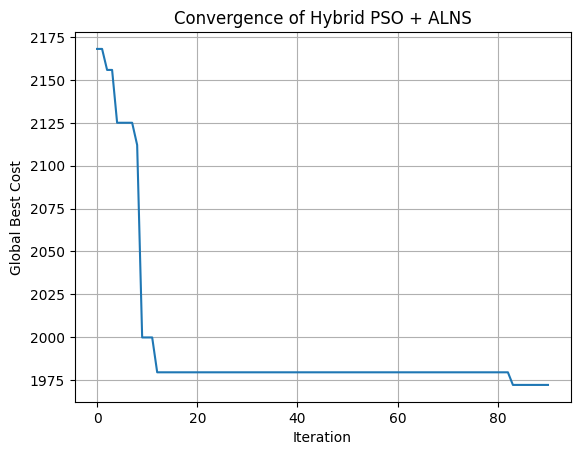

In [33]:
# Visualisasi
import matplotlib.pyplot as plt

plt.plot(trace)
plt.xlabel("Iteration")
plt.ylabel("Global Best Cost")
plt.title("Convergence of Hybrid PSO + ALNS")
plt.grid(True)
plt.show()


In [34]:
print(trace)

[2168.1558477536955, 2168.1558477536955, 2155.896935280293, 2155.896935280293, 2125.0682470250576, 2125.0682470250576, 2125.0682470250576, 2125.0682470250576, 2112.0931094033695, 1999.7894760471038, 1999.7894760471038, 1999.7894760471038, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1979.448316868204, 1

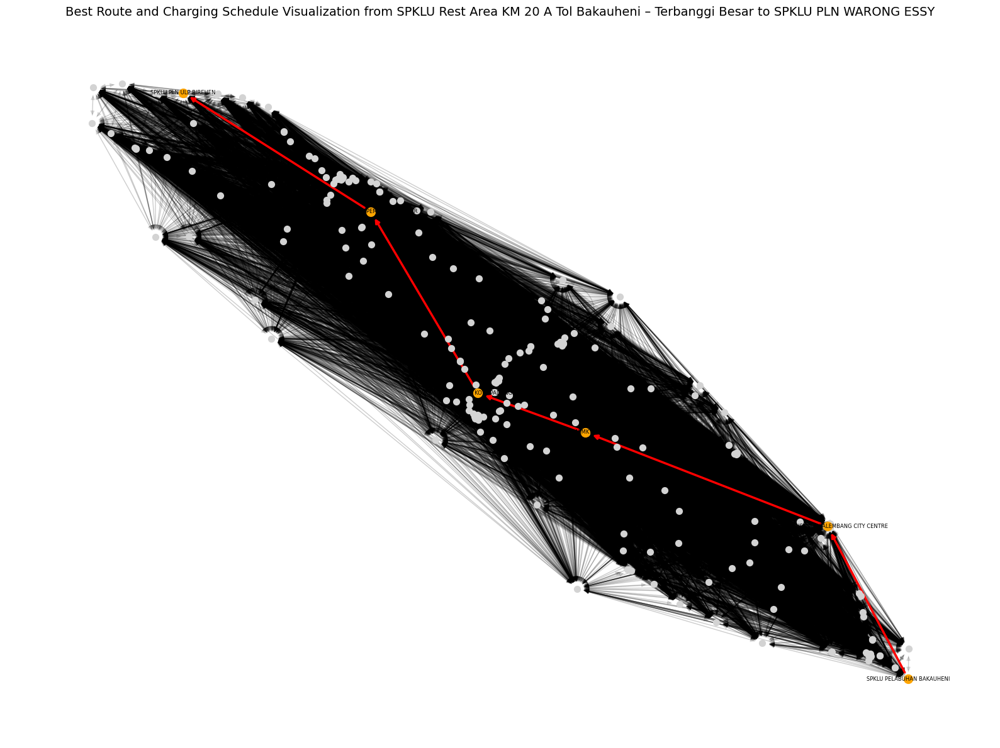

In [35]:
import pickle
import networkx as nx
import matplotlib.pyplot as plt

# ====== STEP 1: Load Graph dari File ======
with open("spklu_sumatera_graph_with_parameters_231_modified.pkl", "rb") as f:
    G = pickle.load(f)

# ====== STEP 2: Rute terbaik hasil decoding ======
decoded_route = rute_decoded

# ====== STEP 3: Ambil posisi dari koordinat node ======
pos = {
    node: (data["longitude"], data["latitude"])
    for node, data in G.nodes(data=True)
}

# ====== STEP 4: Visualisasi ======
plt.figure(figsize=(16, 12))

# Gambar semua node dan edge sebagai background
nx.draw_networkx_nodes(G, pos, node_size=50, node_color="lightgray")
nx.draw_networkx_edges(G, pos, alpha=0.1)

# Highlight node yang termasuk dalam rute terbaik
nx.draw_networkx_nodes(G, pos, nodelist=decoded_route, node_size=100, node_color="orange")

# Buat edge list dari rute
route_edges = list(zip(decoded_route[:-1], decoded_route[1:]))
nx.draw_networkx_edges(G, pos, edgelist=route_edges, width=2.5, edge_color="red")

# Tambahkan label nama SPKLU di node rute
route_labels = {node: G.nodes[node]['name'] for node in decoded_route}
nx.draw_networkx_labels(G, pos, labels=route_labels, font_size=6)

# Styling plot
plt.title("Best Route and Charging Schedule Visualization from SPKLU Rest Area KM 20 A Tol Bakauheni – Terbanggi Besar to SPKLU PLN WARONG ESSY", fontsize=14)
plt.axis("off")
plt.tight_layout()
plt.show()


In [36]:
def pretty_print_charging_schedule(schedule, ev_capacity, node_name_map):
    print("Charging Schedule:")
    for node_id, info in schedule.items():
        print(f"Node {node_id}")
        if node_name_map:
            print(f"Charging Station Name: {node_name_map.get(node_id, '-')}")
        print(f"- SOC Start: {info['soc_start']:.2f} / {ev_capacity}")
        print(f"- SOC Target: {info['soc_target']:.2f} / {ev_capacity}")
        print(f"- Charging Rate: {info['charging_rate']} kW")
        print(f"- Charging Duration: {info['charging_time']:.2f} min\n")

In [37]:
node_name_map = {node_id: data["name"] for node_id, data in graph.nodes(data=True)}


pretty_print_charging_schedule(gbest_charge, ev.capacity, node_name_map)

print("Total Travel Time:", evaluate(graph, ev, rute_decoded, gbest_charge), "min")

Charging Schedule:
Node 220
Charging Station Name: SPKLU TRANSMART PALEMBANG CITY CENTRE
- SOC Start: 39.73 / 118
- SOC Target: 104.18 / 118
- Charging Rate: 22 kW
- Charging Duration: 175.77 min

Node 54
Charging Station Name: SPKLU PLN MK CAR WASH
- SOC Start: 23.60 / 118
- SOC Target: 56.66 / 118
- Charging Rate: 50 kW
- Charging Duration: 39.67 min

Node 52
Charging Station Name: SPKLU PLN KTR WALI KOTA PADANG PANJANG
- SOC Start: 23.60 / 118
- SOC Target: 109.48 / 118
- Charging Rate: 50 kW
- Charging Duration: 103.05 min

Node 186
Charging Station Name: SPKLU PLN UP3 PEMATANGSIANTAR
- SOC Start: 23.60 / 118
- SOC Target: 100.35 / 118
- Charging Rate: 100 kW
- Charging Duration: 46.05 min

Total Travel Time: 1972.0871134480221 min


In [38]:
edges_to_check = [(30, 18), (30, 51), (51, 18)]

for u, v in edges_to_check:
    edge_data = graph.get_edge_data(u, v)
    if edge_data:
        print(f"🔹 Edge ({u} → {v})")
        print(f"weight (durasi): {edge_data['weight']:.2f} menit")
        print(f"distance: {edge_data['distance']:.2f} km")
        print(f"mean: {edge_data['mean']:.2f}")
        print(f"std: {edge_data['std']:.2f}\n")
    else:
        print(f"❌ Edge ({u} → {v}) tidak ditemukan di graph.\n")


🔹 Edge (30 → 18)
weight (durasi): 149.70 menit
distance: 161.09 km
mean: 149.70
std: 14.97

🔹 Edge (30 → 51)
weight (durasi): 250.26 menit
distance: 310.39 km
mean: 250.26
std: 25.03

🔹 Edge (51 → 18)
weight (durasi): 396.31 menit
distance: 471.60 km
mean: 396.31
std: 39.63

